In [1]:
%%capture
!unset LD_PRELOAD
import os
os.environ.pop('LD_PRELOAD', None)

In [2]:
!cd causal-curiosity/envs && ls

__init__.py  dmc.py  gym.py  skeleton.py


In [7]:
!cd causal-curiosity
!pip install uv uvicorn
!uv pip install -r causal-curiosity/requirements.txt 

Using Python 3.11.10 environment at: /opt/conda
Audited 141 packages in 33ms


In [1]:
import os
from dotenv import load_dotenv, find_dotenv

ENV = load_dotenv(find_dotenv())

REPOPATH = os.getenv('REPOPATH', 'causal-curiosity')
print(f"REPOPATH: {REPOPATH}")
os.chdir((os.path.join(REPOPATH, 'notebooks')))
print(f"Current working directory: {os.getcwd()}")

REPOPATH: causal-curiosity
Current working directory: /home/jovyan/causal-curiosity/notebooks


In [2]:
# !nvidia-smi
# !cat /etc/os-release
import torch 

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cuda


In [3]:
import sys 
import os

sys.path.append(os.path.join('..')) # to find envs.gym
sys.path.append(os.path.join('..', 'envs')) # to find envs.skeleton
sys.path.append(os.path.join('..', 'agent')) # to find encoder, decoder

from envs.gym import Ant
from agent.ae import AutoEncoder2d

ModuleNotFoundError: No module named 'agent.ae'

In [6]:
from agent.policy import Policy

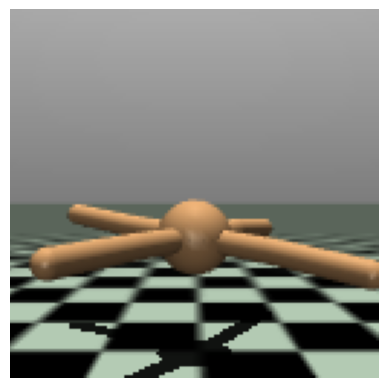

In [2]:
env = Ant(image_states=True, width=128, height=128)

env.render_image()

In [3]:
frame = env.render()
print(frame.shape)  # should be (128, 128, 3
print("frame dtype:", frame.dtype)  # should be uint8
print("frame min:", frame.min(), "max:", frame.max())  # should be in [0, 255]

(128, 128, 3)
frame dtype: uint8
frame min: 0 max: 243


In [4]:
ae = AutoEncoder2d(shape=(128, 128, 3), latent_dim=512)

In [6]:
import torch 

num_steps = 10_000
images = []
for _ in range(num_steps):
    img = env.render()  # shape: (128, 128, 3), dtype: uint8
    images.append(img)
    # env.record()
    action = env.action_space.sample()
    env.step(action)

images = torch.tensor(images, dtype=torch.float32).permute(0, 3, 1, 2) / 255.0  # [N, C, H, W]

# Training loop
optimizer = torch.optim.Adam(list(ae.encoder.parameters()) + list(ae.decoder.parameters()), lr=5e-4)
criterion = torch.nn.MSELoss()
batch_size = 32

for epoch in range(10):
    for i in range(0, len(images), batch_size):
        batch = images[i:i+batch_size]
        recon = ae.forward(batch)
        loss = criterion(recon, batch)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
    print(f"Epoch {epoch}, Loss: {loss.item()}")

# To get z for an image:
test_img = images[0].unsqueeze(0)
z = ae.encoder(test_img)  # z is the learned latent representation

C:\Users\marku\AppData\Local\Temp\ipykernel_4284\2519494510.py:12: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\pytorch\torch\csrc\utils\tensor_new.cpp:257.)
  images = torch.tensor(images, dtype=torch.float32).permute(0, 3, 1, 2) / 255.0  # [N, C, H, W]


Epoch 0, Loss: 0.04682664945721626
Epoch 1, Loss: 0.04492749646306038
Epoch 2, Loss: 0.04301466420292854
Epoch 3, Loss: 0.04394833371043205
Epoch 4, Loss: 0.0384240560233593
Epoch 5, Loss: 0.02590344287455082
Epoch 6, Loss: 0.02415894903242588
Epoch 7, Loss: 0.018003450706601143
Epoch 8, Loss: 0.015514564700424671
Epoch 9, Loss: 0.01594981737434864


In [ ]:
# torch.save(ae.encoder.state_dict(), "../models/encoder.pth")
# torch.save(ae.decoder.state_dict(), "../models/decoder.pth")
# torch.save(ae, "../models/autoencoder.pth")

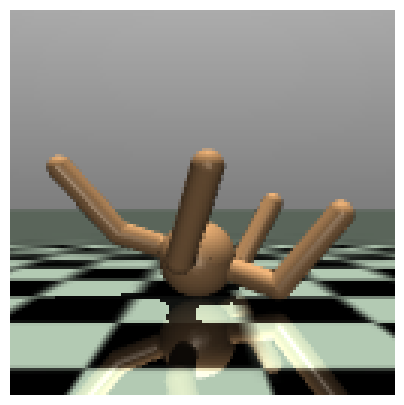

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.081686884..1.00555].


Decoded frame shape: (128, 128, 3)


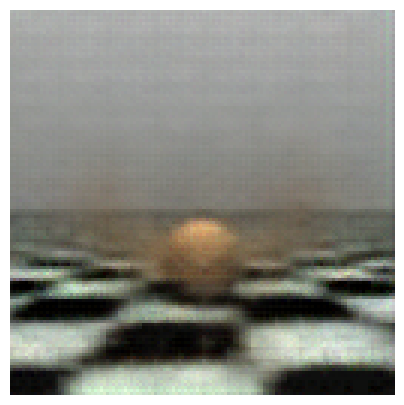

In [8]:
import matplotlib.pyplot as plt

# print original image
plt.figure(figsize=(5, 5))
plt.axis('off')
plt.imshow(test_img[0].permute(1, 2, 0).detach().cpu().numpy())
plt.show()

frame = ae.decoder(z).detach().cpu().numpy()  # shape: (1, 3, 128, 128)
frame = frame[0].transpose(1, 2, 0)           # shape: (128, 128, 3)
print("Decoded frame shape:", frame.shape)
plt.figure(figsize=(5, 5))
plt.axis('off')
plt.imshow(frame)
plt.show()

In [9]:
FIRST_K = 50
ae_frames = [ae.decoder(ae.encoder(img.unsqueeze(0))).detach().cpu().numpy()[0].transpose(1, 2, 0) for img in images][:FIRST_K]
frames = [img.permute(1, 2, 0).detach().cpu().numpy() for img in images][:FIRST_K]

In [10]:
ae_frames[0] == ae_frames[10]

array([[[False, False, False],
        [False, False, False],
        [False, False, False],
        ...,
        [False, False, False],
        [False, False, False],
        [False, False, False]],

       [[False, False, False],
        [False, False, False],
        [False, False, False],
        ...,
        [False, False, False],
        [False, False, False],
        [False, False, False]],

       [[False, False, False],
        [False, False, False],
        [False, False, False],
        ...,
        [False, False, False],
        [False, False, False],
        [False, False, False]],

       ...,

       [[False, False, False],
        [False, False, False],
        [False, False, False],
        ...,
        [False, False, False],
        [False, False, False],
        [False, False, False]],

       [[False, False, False],
        [False, False, False],
        [False, False, False],
        ...,
        [False, False, False],
        [False, False, False],
        [False,

In [11]:
import matplotlib.pyplot as plt
from matplotlib import animation
from IPython.display import HTML

fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].axis('off')
axes[1].axis('off')
im1 = axes[0].imshow(ae_frames[0], animated=True)
im2 = axes[1].imshow(frames[0], animated=True)
axes[0].set_title('Original')
axes[1].set_title('Autoencoded')

def animate(i):
    im1.set_array(ae_frames[i])
    im2.set_array(frames[i])
    return [im1, im2]

anim = animation.FuncAnimation(fig, animate, frames=len(frames), interval=50, blit=False)

plt.close(fig)
HTML(anim.to_jshtml())

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.081686884..1.00555].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.081686884..1.00555].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.081686884..1.00555].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.08342743..1.00639].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0863298..0.99404156].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.10396695..1.1046909].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.097871885..1.1583381].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.101723656..1.1551362].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.09305754..1.1243354].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.

In [ ]:
cb382c841d04409780b6afb6805093a4